<a href="https://colab.research.google.com/github/MrData-Science/DecisionTree/blob/main/DecisionTree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Práctica 02


## Install libraries

In [ ]:
!pip install shap --quiet

In [ ]:
!pip install pycaret --quiet

In [ ]:
!pip install -U kaleido --quiet
# !pip install -U dataprep --quiet

In [ ]:
!pip install -U skrub --quiet

## Load libraries

In [ ]:
import pandas as pd
import numpy as np


# from dataprep.eda import create_report

## Load Data

In [ ]:
url = str('/content/Producción_Cultivos_ProductosGanaderia_S_Todos_los_Datos_NOFLAG (1).csv')
# source_data = pd.read_csv(url)
source_data = pd.read_csv(url, encoding='latin1')


print(f'Shape: {source_data.shape}')

Shape: (79606, 71)


In [ ]:
source_data.head(1)

,Código del área,Código del área (M49),Área,Código del producto,Código del producto (CPC),Producto,Código del elemento,Elemento,Unidad,Y1961,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022
0,2,'004,Afganistán,268,'21631.01,"Aceite de girasol, en bruto",5510,Producción,toneladas,2937.75,...,137.68,960.46,1035.28,1804.72,3167.46,3198.89,3130.58,2511.67,2013.48,NaN


In [ ]:
source_data.tail(1)

,Código del área,Código del área (M49),Área,Código del producto,Código del producto (CPC),Producto,Código del elemento,Elemento,Unidad,Y1961,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022
79605,5817,'902,Import netos alim en Des,1746,'F1746,Vacas y búfalos,5111,Existencias,Cabeza,184678287.0,...,457089548.0,468137726.0,477840366.0,489005172.0,494048920.0,494970628.0,505975948.0,521704826.0,526230912.0,539044583.0


In [ ]:
source_data.columns

Index(['Código del área', 'Código del área (M49)', 'Área',
       'Código del producto', 'Código del producto (CPC)', 'Producto',
       'Código del elemento', 'Elemento', 'Unidad', 'Y1961', 'Y1962', 'Y1963',
       'Y1964', 'Y1965', 'Y1966', 'Y1967', 'Y1968', 'Y1969', 'Y1970', 'Y1971',
       'Y1972', 'Y1973', 'Y1974', 'Y1975', 'Y1976', 'Y1977', 'Y1978', 'Y1979',
       'Y1980', 'Y1981', 'Y1982', 'Y1983', 'Y1984', 'Y1985', 'Y1986', 'Y1987',
       'Y1988', 'Y1989', 'Y1990', 'Y1991', 'Y1992', 'Y1993', 'Y1994', 'Y1995',
       'Y1996', 'Y1997', 'Y1998', 'Y1999', 'Y2000', 'Y2001', 'Y2002', 'Y2003',
       'Y2004', 'Y2005', 'Y2006', 'Y2007', 'Y2008', 'Y2009', 'Y2010', 'Y2011',
       'Y2012', 'Y2013', 'Y2014', 'Y2015', 'Y2016', 'Y2017', 'Y2018', 'Y2019',
       'Y2020', 'Y2021', 'Y2022'],
      dtype='object')

In [ ]:
# important_features = ['Área', 'Producto', ]
non_important_features = ['Código del área', 'Código del área (M49)',
                          'Código del producto', 'Código del producto (CPC)',
                          'Código del elemento']

source_data[non_important_features].columns

source_data.columns.difference(non_important_features)

data = source_data[source_data.columns.difference(non_important_features)]
print(f'Shape: {data.shape}')

Shape: (79606, 66)


In [ ]:
data.head(1)

,Elemento,Producto,Unidad,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,...,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022,Área
0,Producción,"Aceite de girasol, en bruto",toneladas,2937.75,3137.75,3137.75,3137.75,3237.75,3437.75,3438.5,...,960.46,1035.28,1804.72,3167.46,3198.89,3130.58,2511.67,2013.48,NaN,Afganistán


In [ ]:
# import pandas as pd
# from dataprep.eda import create_report

# # Suponiendo que tienes tu DataFrame de datos en data_df
# # Aquí data_df es un DataFrame que contiene tus datos
# # Por favor, asegúrate de tener tu DataFrame en el formato correcto antes de ejecutar este código

# # Crear el reporte
# report = create_report(data.sample(n=1000, random_state=42))

# # Guardar el reporte como HTML
# report.save("reporte.html")

In [ ]:
data_features = data.columns
data_features

Index(['Elemento', 'Producto', 'Unidad', 'Y1961', 'Y1962', 'Y1963', 'Y1964',
       'Y1965', 'Y1966', 'Y1967', 'Y1968', 'Y1969', 'Y1970', 'Y1971', 'Y1972',
       'Y1973', 'Y1974', 'Y1975', 'Y1976', 'Y1977', 'Y1978', 'Y1979', 'Y1980',
       'Y1981', 'Y1982', 'Y1983', 'Y1984', 'Y1985', 'Y1986', 'Y1987', 'Y1988',
       'Y1989', 'Y1990', 'Y1991', 'Y1992', 'Y1993', 'Y1994', 'Y1995', 'Y1996',
       'Y1997', 'Y1998', 'Y1999', 'Y2000', 'Y2001', 'Y2002', 'Y2003', 'Y2004',
       'Y2005', 'Y2006', 'Y2007', 'Y2008', 'Y2009', 'Y2010', 'Y2011', 'Y2012',
       'Y2013', 'Y2014', 'Y2015', 'Y2016', 'Y2017', 'Y2018', 'Y2019', 'Y2020',
       'Y2021', 'Y2022', 'Área'],
      dtype='object')

In [ ]:
categorical_features = ['Área', 'Elemento', 'Producto', 'Unidad']

numerical_features = data_features.difference(categorical_features)

print(f'data_features: {len(data_features)} categorical_features: {len(categorical_features)} numerical_features: {len(numerical_features)}')
# print(f'data_features: {type(data_features)} categorical_features: {type(categorical_features)} numerical_features: {type(numerical_features)}')

data_features: 66 categorical_features: 4 numerical_features: 62


In [ ]:
numerical_data = data[numerical_features].replace({np.nan : 0})
categorical_data = data[categorical_features].replace({np.nan : 'unknown'})

numerical_data.shape, categorical_data.shape

((79606, 62), (79606, 4))

## Preprocess Data



```
>>> from sklearn.preprocessing import StandardScaler
>>> data = [[0, 0], [0, 0], [1, 1], [1, 1]]
>>> scaler = StandardScaler()
>>> print(scaler.fit(data))
StandardScaler()
>>> print(scaler.mean_)
[0.5 0.5]
>>> print(scaler.transform(data))
[[-1. -1.]
 [-1. -1.]
 [ 1.  1.]
 [ 1.  1.]]
>>> print(scaler.transform([[2, 2]]))
[[3. 3.]]
```



In [ ]:
numerical_data.head(1)

,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,Y1968,Y1969,Y1970,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022
0,2937.75,3137.75,3137.75,3137.75,3237.75,3437.75,3438.5,3537.75,3637.75,3437.0,...,137.68,960.46,1035.28,1804.72,3167.46,3198.89,3130.58,2511.67,2013.48,0.0


In [ ]:
categorical_data.head(1)

,Área,Elemento,Producto,Unidad
0,Afganistán,Producción,"Aceite de girasol, en bruto",toneladas


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler

StandardScaler()

In [ ]:
scaler.fit(numerical_data)

StandardScaler()

In [ ]:
# numerical_data_preprocessed = pd.DataFrame(numerical_data_preprocessed).replace({np.nan : '0'})
# pd.DataFrame(numerical_data_preprocessed).isnull().sum().sum()

In [ ]:
numerical_data_preprocessed = scaler.fit_transform(numerical_data)
numerical_data_preprocessed

array([[-0.08170223, -0.0820734 , -0.08231475, ..., -0.08556038,
        -0.08518179, -0.08311888],
       [-0.08175299, -0.08216526, -0.08240818, ..., -0.08556502,
        -0.08517949, -0.08311888],
       [-0.08154958, -0.08174008, -0.08169966, ..., -0.08539431,
        -0.08501052, -0.08311888],
       ...,
       [-0.07804807, -0.0784724 , -0.07880722, ..., -0.08284801,
        -0.08245277, -0.08037187],
       [ 2.58709661,  2.61067962,  2.59585468, ...,  6.20500712,
         6.30920094,  6.4531452 ],
       [13.60539009, 13.61430869, 13.64782722, ..., 14.7562109 ,
        14.4845313 , 14.53719215]])



```
>>> from sklearn.preprocessing import OneHotEncoder
>>> enc = OneHotEncoder(handle_unknown='ignore')
>>> X = [['Male', 1], ['Female', 3], ['Female', 2]]
>>> enc.fit(X)
OneHotEncoder(handle_unknown='ignore')
>>> enc.categories_
[array(['Female', 'Male'], dtype=object), array([1, 2, 3], dtype=object)]
>>> enc.transform([['Female', 1], ['Male', 4]]).toarray()
array([[1., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.]])
>>> enc.inverse_transform([[0, 1, 1, 0, 0], [0, 0, 0, 1, 0]])
array([['Male', 1],
       [None, 2]], dtype=object)
>>> enc.get_feature_names_out(['gender', 'group'])
array(['gender_Female', 'gender_Male', 'group_1', 'group_2', 'group_3'], ...)
```



In [ ]:
from sklearn.preprocessing import OneHotEncoder
from skrub import SimilarityEncoder

# encoder = OneHotEncoder()
# encoder = OneHotEncoder(max_categories=50)

encoder = SimilarityEncoder()
encoder

SimilarityEncoder()

In [ ]:
encoder.fit(categorical_data)

SimilarityEncoder()

In [ ]:
categorical_data_preprocessed = encoder.fit_transform(categorical_data)
categorical_data_preprocessed

array([[1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       [1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       [1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.11111111,
        0.        ],
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.        ,
        1.        ],
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.04347826,
        0.        ]])

In [ ]:
pd.DataFrame(categorical_data_preprocessed).isnull().sum().sum()

0

In [ ]:
categorical_data_preprocessed

array([[1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       [1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       [1.        , 0.08510638, 0.08      , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.11111111,
        0.        ],
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.        ,
        1.        ],
       [0.02      , 0.03333333, 0.03225806, ..., 0.        , 0.04347826,
        0.        ]])

## Visualize Data



```
>>> import numpy as np
>>> from sklearn.decomposition import PCA
>>> X = np.array([[-1, -1], [-2, -1], [-3, -2], [1, 1], [2, 1], [3, 2]])
>>> pca = PCA(n_components=2)
>>> pca.fit(X)
PCA(n_components=2)
>>> print(pca.explained_variance_ratio_)
[0.9924... 0.0075...]
>>> print(pca.singular_values_)
[6.30061... 0.54980...]
```



In [ ]:
import plotly.express as px
import numpy as np
from sklearn.decomposition import PCA

# pca = PCA(n_components=3)
pca = PCA(n_components=2)
pca


# Suponiendo que tienes tus datos en numerical_data_preprocessed
# y que ya has instanciado un objeto PCA llamado pca
# y has ajustado los datos utilizando pca.fit(numerical_data_preprocessed)

# Realiza la transformación de PCA
numerical_transformed_data = pca.fit_transform(numerical_data_preprocessed)

# Ahora vamos a crear un DataFrame con los datos transformados
numerical_transformed_df = pd.DataFrame(numerical_transformed_data, columns=[f'Componente{i}' for i in range(1, pca.n_components_+1)])

# Suponiendo que tienes un DataFrame original llamado original_df
# Añade las columnas de datos originales a transformed_df si es necesario
# transformed_df[['Feature1', 'Feature2', ...]] = original_df[['Feature1', 'Feature2', ...]]

# Plot con Plotly Express
# fig = px.scatter_3d(numerical_transformed_df, x='Componente1', y='Componente2', z='Componente3')
fig = px.scatter(numerical_transformed_df, x='Componente1', y='Componente2')


# Renderizar el gráfico como una imagen PNG
fig.write_image("numerical_transformed_df.png")

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np
from sklearn.decomposition import TruncatedSVD

# pca = PCA(n_components=3)
# pca = TruncatedSVD(n_components=3)
pca = TruncatedSVD(n_components=2)
pca

# Suponiendo que tienes tus datos en categorical_data_preprocessed
# y que ya has instanciado un objeto TruncatedSVD llamado pca
# y has ajustado los datos utilizando pca.fit(categorical_data_preprocessed)

# Realiza la transformación de TruncatedSVD
categorical_transformed_data = pca.fit_transform(categorical_data_preprocessed)

# Ahora vamos a crear un DataFrame con los datos transformados
num_components = 2  # Número de componentes especificado
categorical_transformed_df = pd.DataFrame(categorical_transformed_data, columns=[f'Componente{i}' for i in range(1, num_components+1)])


# Plot con Plotly Express
# fig = px.scatter_3d(categorical_transformed_df, x='Componente1', y='Componente2', z='Componente3')
fig = px.scatter(categorical_transformed_df, x='Componente1', y='Componente2')

# Renderizar el gráfico como una imagen PNG
fig.write_image("categorical_transformed_df.png")

fig.show()

In [ ]:
import plotly.express as px
import numpy as np
from sklearn.decomposition import PCA

# pca = PCA(n_components=3)
pca = PCA(n_components=2)
pca


# Suponiendo que tienes tus datos en numerical_data_preprocessed
# y que ya has instanciado un objeto PCA llamado pca
# y has ajustado los datos utilizando pca.fit(numerical_data_preprocessed)

# Realiza la transformación de PCA
mixed_transformed_data = pca.fit_transform(pd.concat([pd.DataFrame(numerical_data_preprocessed), pd.DataFrame(categorical_data_preprocessed)], axis=1))

# Ahora vamos a crear un DataFrame con los datos transformados
mixed_transformed_df = pd.DataFrame(mixed_transformed_data, columns=[f'Componente{i}' for i in range(1, pca.n_components_+1)])

# Suponiendo que tienes un DataFrame original llamado original_df
# Añade las columnas de datos originales a transformed_df si es necesario
# transformed_df[['Feature1', 'Feature2', ...]] = original_df[['Feature1', 'Feature2', ...]]

# Plot con Plotly Express
# fig = px.scatter_3d(numerical_transformed_df, x='Componente1', y='Componente2', z='Componente3')
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2')


# Renderizar el gráfico como una imagen PNG
fig.write_image("mixed_transformed_df.png")

fig.show()

In [ ]:
print(f'Shape: {mixed_transformed_df.shape}')
mixed_transformed_df.head()

Shape: (79606, 2)


,Componente1,Componente2
0,-0.656343,-0.015140
1,-0.656756,-0.014407
2,-0.655029,-0.011516
3,-0.656035,-0.012996
4,-0.657594,-0.013264


In [ ]:
import plotly.express as px
import numpy as np
from sklearn.decomposition import PCA

# pca = PCA(n_components=3)
pca = PCA(n_components=2)
pca


# Suponiendo que tienes tus datos en numerical_data_preprocessed
# y que ya has instanciado un objeto PCA llamado pca
# y has ajustado los datos utilizando pca.fit(numerical_data_preprocessed)

# Realiza la transformación de PCA
mixed_transformed_data = pca.fit_transform(pd.concat([pd.DataFrame(numerical_data_preprocessed), pd.DataFrame(categorical_data_preprocessed)], axis=1).sample(n=10000, random_state=42))


# Ahora vamos a crear un DataFrame con los datos transformados
mixed_transformed_df = pd.DataFrame(mixed_transformed_data, columns=[f'Componente{i}' for i in range(1, pca.n_components_+1)])

# Suponiendo que tienes un DataFrame original llamado original_df
# Añade las columnas de datos originales a transformed_df si es necesario
# transformed_df[['Feature1', 'Feature2', ...]] = original_df[['Feature1', 'Feature2', ...]]

# Plot con Plotly Express
# fig = px.scatter_3d(numerical_transformed_df, x='Componente1', y='Componente2', z='Componente3')
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2')


# Renderizar el gráfico como una imagen PNG
fig.write_image("mixed_transformed_df.png")

fig.show()

In [ ]:
print(f'Shape: {mixed_transformed_df.shape}')
mixed_transformed_df.head()

Shape: (10000, 2)


,Componente1,Componente2
0,-0.731975,-0.021357
1,-0.729341,0.007793
2,-0.731683,-0.014264
3,-0.729526,-0.010200
4,-0.719850,-0.007192


## Model Data

### Unsupervised Learning

In [ ]:

import pandas as pd
from sklearn.cluster import DBSCAN
import plotly.express as px

# Asumiendo que tienes el resultado de pca.fit_transform() en mixed_transformed_data
# Primero, convierte mixed_transformed_data a un DataFrame de pandas si aún no lo has hecho
# mixed_transformed_data_df = pd.DataFrame(mixed_transformed_data, columns=['Componente1', 'Componente2'])

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=10)  # Ajusta los parámetros según tus datos
clusters = dbscan.fit_predict(mixed_transformed_df)

# Agregar la asignación de clusters al DataFrame
mixed_transformed_df['Cluster'] = clusters

# Identificar outliers (DBSCAN asigna el cluster -1 a outliers)
mixed_transformed_df['Outlier'] = mixed_transformed_df['Cluster'] == -1

# Visualizar con Plotly
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2', color='Outlier',
                 title="Datos Normales vs Anómalos con DBSCAN",
                 labels={"Outlier": "Es Anómalo"},
                 color_continuous_midpoint=0.5)

fig.show()


In [ ]:

import pandas as pd
from sklearn.cluster import DBSCAN
import plotly.express as px

# Asumiendo que tienes el resultado de pca.fit_transform() en mixed_transformed_data
# Primero, convierte mixed_transformed_data a un DataFrame de pandas si aún no lo has hecho
# mixed_transformed_data_df = pd.DataFrame(mixed_transformed_data, columns=['Componente1', 'Componente2'])

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=10)  # Ajusta los parámetros según tus datos
clusters = dbscan.fit_predict(mixed_transformed_df)

# Agregar la asignación de clusters al DataFrame
mixed_transformed_df['Cluster'] = clusters

# Identificar outliers (DBSCAN asigna el cluster -1 a outliers)
mixed_transformed_df['Outlier'] = mixed_transformed_df['Cluster'] == -1

# Visualizar con Plotly
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2', color='Outlier',
                 title="Datos Normales vs Anómalos con DBSCAN",
                 labels={"Outlier": "Es Anómalo"},
                 color_continuous_midpoint=0.5)

fig.show()


In [ ]:

import pandas as pd
from sklearn.cluster import DBSCAN
import plotly.express as px

# Asumiendo que tienes el resultado de pca.fit_transform() en mixed_transformed_data
# Primero, convierte mixed_transformed_data a un DataFrame de pandas si aún no lo has hecho
# mixed_transformed_data_df = pd.DataFrame(mixed_transformed_data, columns=['Componente1', 'Componente2'])

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.7, min_samples=10)  # Ajusta los parámetros según tus datos
clusters = dbscan.fit_predict(mixed_transformed_df)

# Agregar la asignación de clusters al DataFrame
mixed_transformed_df['Cluster'] = clusters

# Identificar outliers (DBSCAN asigna el cluster -1 a outliers)
mixed_transformed_df['Outlier'] = mixed_transformed_df['Cluster'] == -1

# Visualizar con Plotly
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2', color='Outlier',
                 title="Datos Normales vs Anómalos con DBSCAN",
                 labels={"Outlier": "Es Anómalo"},
                 color_continuous_midpoint=0.5)

fig.show()


In [ ]:

import pandas as pd
from sklearn.cluster import DBSCAN
import plotly.express as px

# Asumiendo que tienes el resultado de pca.fit_transform() en mixed_transformed_data
# Primero, convierte mixed_transformed_data a un DataFrame de pandas si aún no lo has hecho
# mixed_transformed_data_df = pd.DataFrame(mixed_transformed_data, columns=['Componente1', 'Componente2'])

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.9, min_samples=10)  # Ajusta los parámetros según tus datos
clusters = dbscan.fit_predict(mixed_transformed_df)

# Agregar la asignación de clusters al DataFrame
mixed_transformed_df['Cluster'] = clusters

# Identificar outliers (DBSCAN asigna el cluster -1 a outliers)
mixed_transformed_df['Outlier'] = mixed_transformed_df['Cluster'] == -1

# Visualizar con Plotly
fig = px.scatter(mixed_transformed_df, x='Componente1', y='Componente2', color='Outlier',
                 title="Datos Normales vs Anómalos con DBSCAN",
                 labels={"Outlier": "Es Anómalo"},
                 color_continuous_midpoint=0.5)

fig.show()


### Supervised Learning

In [ ]:
from pycaret.classification import *

In [ ]:


# Asegúrate de que mixed_transformed_data_df es tu DataFrame y que ya tiene las columnas 'Outlier'
# También, asegúrate de eliminar la columna 'Cluster' si aún no lo has hecho
data_labeled = mixed_transformed_df.drop(columns=['Cluster'])

# Inicializa el setup de PyCaret para clasificación
clf1 = setup(data_labeled, target='Outlier', session_id=123)

# Compara modelos para encontrar el mejor basado en una métrica específica, por ejemplo, la precisión
best_model = compare_models()

# O puedes crear un modelo específico, por ejemplo, un Árbol de Decisión
# dt = create_model('dt')



,Description,Value
0,Session id,123
1,Target,Outlier
2,Target type,Binary
3,Original data shape,"(10000, 3)"
4,Transformed data shape,"(10000, 3)"
5,Transformed train set shape,"(7000, 3)"
6,Transformed test set shape,"(3000, 3)"
7,Numeric features,2
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9997,1.0000,0.9929,0.9933,0.9928,0.9927,0.9928,0.4840
knn,K Neighbors Classifier,0.9994,1.0000,0.9719,1.0000,0.9852,0.9849,0.9853,0.1440
et,Extra Trees Classifier,0.9994,1.0000,0.9790,0.9933,0.9857,0.9854,0.9857,0.3240
dt,Decision Tree Classifier,0.9993,0.9926,0.9857,0.9795,0.9823,0.9819,0.9821,0.0690
gbc,Gradient Boosting Classifier,0.9991,1.0000,0.9714,0.9857,0.9783,0.9779,0.9780,1.0280
ada,Ada Boost Classifier,0.9990,1.0000,0.9643,0.9866,0.9748,0.9743,0.9746,0.2570
xgboost,Extreme Gradient Boosting,0.9987,0.9999,0.9648,0.9733,0.9684,0.9678,0.9681,0.0820
lightgbm,Light Gradient Boosting Machine,0.9987,0.9999,0.9576,0.9800,0.9676,0.9670,0.9676,1.5010
lr,Logistic Regression,0.9966,0.9995,0.9029,0.9302,0.9144,0.9126,0.9138,0.9050
svm,SVM - Linear Kernel,0.9966,0.9995,0.8952,0.9352,0.9133,0.9115,0.9126,0.0780


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

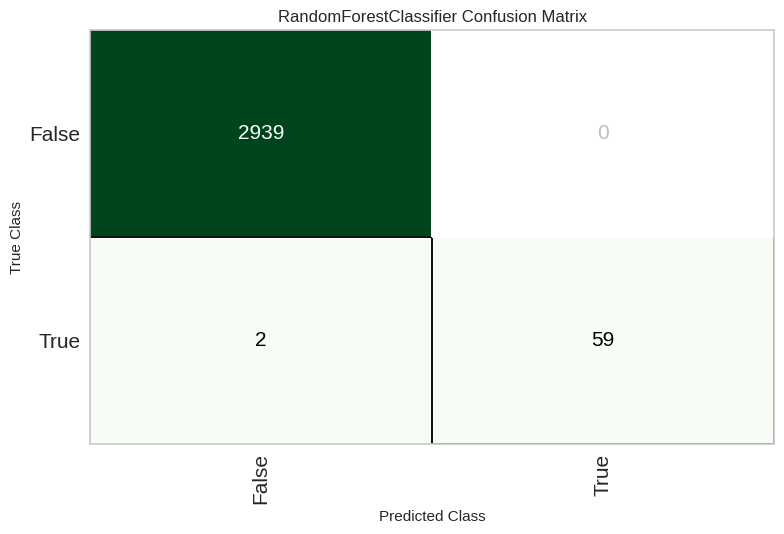

In [ ]:
# Visualizar el modelo; por ejemplo, la matriz de confusión, la curva ROC, etc.
plot_model(best_model, plot='confusion_matrix')

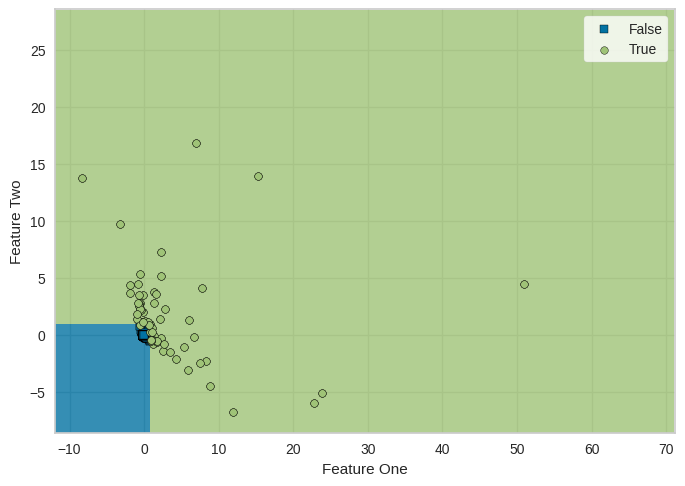

In [ ]:
# Visualizar el modelo; por ejemplo, la matriz de confusión, la curva ROC, etc.
plot_model(best_model, plot='boundary')

In [ ]:
# O puedes crear un modelo específico, por ejemplo, un Árbol de Decisión
dt = create_model('dt')
dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9986,0.9993,1.0000,0.9333,0.9655,0.9648,0.9654
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9971,0.9636,0.9286,0.9286,0.9286,0.9271,0.9271
4,0.9986,0.9993,1.0000,0.9333,0.9655,0.9648,0.9654
5,0.9986,0.9643,0.9286,1.0000,0.9630,0.9622,0.9629
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=123, splitter='best')

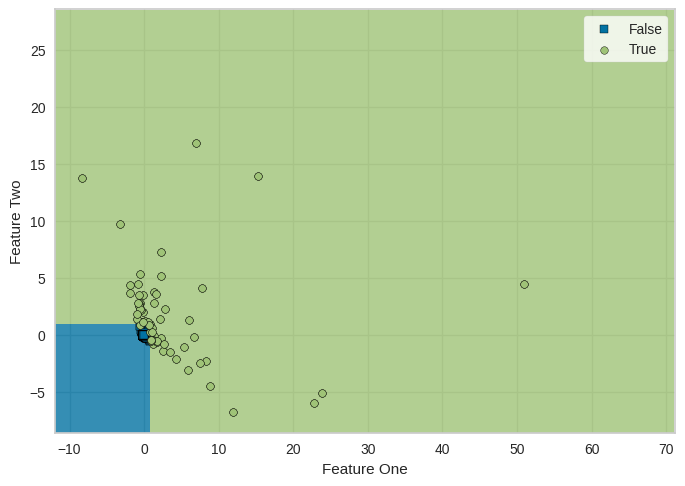

In [ ]:
# Visualizar el modelo; por ejemplo, la matriz de confusión, la curva ROC, etc.
plot_model(dt, plot='boundary')

In [ ]:
# O puedes crear un modelo específico, por ejemplo, un Árbol de Decisión
knn = create_model('knn')
knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9986,0.9999,0.9286,1.0000,0.9630,0.9622,0.9629
6,0.9971,1.0000,0.8571,1.0000,0.9231,0.9216,0.9245
7,0.9986,1.0000,0.9333,1.0000,0.9655,0.9648,0.9654
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

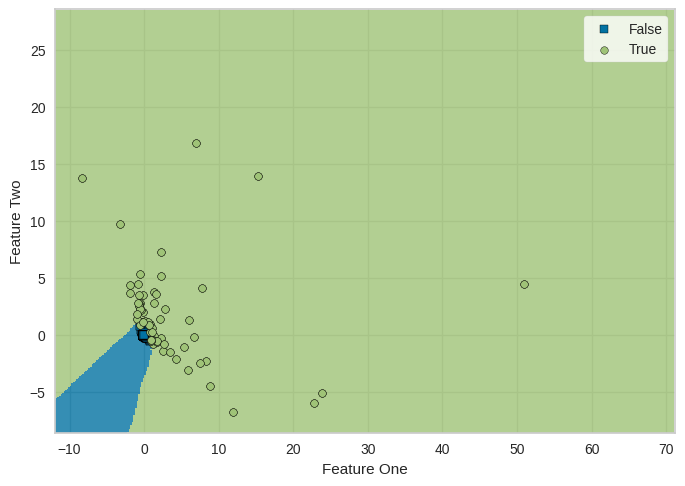

In [ ]:
# Visualizar el modelo; por ejemplo, la matriz de confusión, la curva ROC, etc.
plot_model(knn, plot='boundary')

In [ ]:
# O puedes crear un modelo específico, por ejemplo, un Árbol de Decisión
qda = create_model('qda')
qda

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9771,0.9999,1.0000,0.4667,0.6364,0.6262,0.6751
1,0.9800,1.0000,1.0000,0.5000,0.6667,0.6575,0.6999
2,0.9757,1.0000,1.0000,0.4516,0.6222,0.6115,0.6636
3,0.9757,1.0000,1.0000,0.4516,0.6222,0.6115,0.6636
4,0.9586,1.0000,1.0000,0.3256,0.4912,0.4754,0.5584
5,0.9843,1.0000,1.0000,0.5600,0.7179,0.7105,0.7423
6,0.9829,1.0000,1.0000,0.5385,0.7000,0.6920,0.7274
7,0.9743,1.0000,1.0000,0.4545,0.6250,0.6136,0.6653
8,0.9871,1.0000,1.0000,0.6250,0.7692,0.7630,0.7854


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

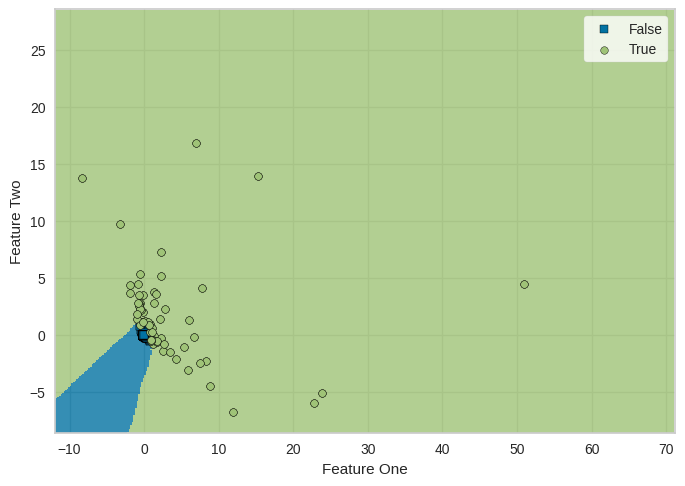

In [ ]:
# Visualizar el modelo; por ejemplo, la matriz de confusión, la curva ROC, etc.
plot_model(knn, plot='boundary')

In [ ]:
mixed_transformed_df['Outlier'].value_counts()

Outlier
False    9796
True      204
Name: count, dtype: int64

In [ ]:
numerical_data = data[numerical_features].replace({np.nan : 0})
categorical_data = data[categorical_features].replace({np.nan : 'unknown'})

numerical_data

,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,Y1968,Y1969,Y1970,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022
0,2.937750e+03,3.137750e+03,3.137750e+03,3.137750e+03,3.237750e+03,3.437750e+03,3.438500e+03,3.537750e+03,3.637750e+03,3.437000e+03,...,1.376800e+02,9.604600e+02,1.035280e+03,1.804720e+03,3.167460e+03,3.198890e+03,3.130580e+03,2.511670e+03,2.013480e+03,0.0
1,2.252800e+03,1.876000e+03,1.830800e+03,2.722400e+03,2.820800e+03,3.148800e+03,3.351200e+03,3.578800e+03,3.374400e+03,3.487600e+03,...,1.333760e+03,1.250000e+03,8.608900e+02,1.042590e+03,1.107840e+03,1.210550e+03,1.407670e+03,2.348420e+03,2.096560e+03,0.0
2,4.997350e+03,7.715830e+03,1.174171e+04,7.960340e+03,7.926480e+03,6.453360e+03,7.574220e+03,5.625000e+03,7.451910e+03,7.846740e+03,...,4.761860e+03,4.832280e+03,5.690840e+03,6.625930e+03,4.176030e+03,6.520000e+03,8.247330e+03,8.349080e+03,8.199220e+03,0.0
3,3.531240e+03,3.700900e+03,2.856680e+03,3.377220e+03,4.326840e+03,4.984400e+03,4.961960e+03,2.509880e+03,3.014440e+03,5.648420e+03,...,7.335700e+02,7.900000e+02,5.374630e+03,1.831561e+04,1.969771e+04,2.518083e+04,2.718553e+04,1.598286e+04,8.987860e+03,0.0
4,8.160000e+01,8.976000e+01,8.160000e+01,8.976000e+01,8.160000e+01,8.976000e+01,8.160000e+01,9.792000e+01,8.160000e+01,9.792000e+01,...,5.459300e+02,6.584200e+02,7.113700e+02,7.409000e+02,7.632500e+02,8.121600e+02,8.332500e+02,7.240900e+02,7.282300e+02,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79601,2.917480e+05,2.952550e+05,3.030720e+05,3.098490e+05,3.327480e+05,3.348150e+05,3.411000e+05,3.602140e+05,3.567580e+05,3.649180e+05,...,1.448935e+06,1.476524e+06,1.483218e+06,1.476686e+06,1.500472e+06,1.525235e+06,1.416998e+06,1.418938e+06,1.331697e+06,0.0
79602,6.893267e+06,7.032332e+06,7.177173e+06,7.211819e+06,7.449207e+06,7.341616e+06,7.559617e+06,7.663850e+06,8.128283e+06,8.609639e+06,...,1.957011e+07,1.945307e+07,1.994979e+07,2.065808e+07,2.155702e+07,2.182914e+07,2.152827e+07,2.259705e+07,2.296227e+07,23794038.0
79603,5.224200e+04,5.259700e+04,5.220200e+04,5.301500e+04,5.374200e+04,5.416900e+04,5.532500e+04,5.538800e+04,5.449700e+04,5.469000e+04,...,9.380400e+04,9.398600e+04,9.428700e+04,9.330100e+04,9.169300e+04,9.657700e+04,9.958700e+04,9.785400e+04,1.005800e+05,101281.0
79604,3.601215e+07,3.698770e+07,3.746607e+07,3.823339e+07,4.003365e+07,3.976869e+07,4.182374e+07,4.244857e+07,4.429673e+07,4.708587e+07,...,1.835763e+08,1.828309e+08,1.881010e+08,1.927428e+08,1.976623e+08,2.108202e+08,2.143944e+08,2.211219e+08,2.309543e+08,240989247.1


In [ ]:
comparative_df = numerical_data.sample(n=10000,random_state=42)
comparative_df.reset_index(drop=True, inplace=True)
comparative_df['Outlier'] = mixed_transformed_df['Outlier']
comparative_df.head(1)

,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,Y1968,Y1969,Y1970,...,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,Y2021,Y2022,Outlier
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,47193.0,47822.0,48805.0,50223.0,0.0,0.0,0.0,0.0,0.0,False


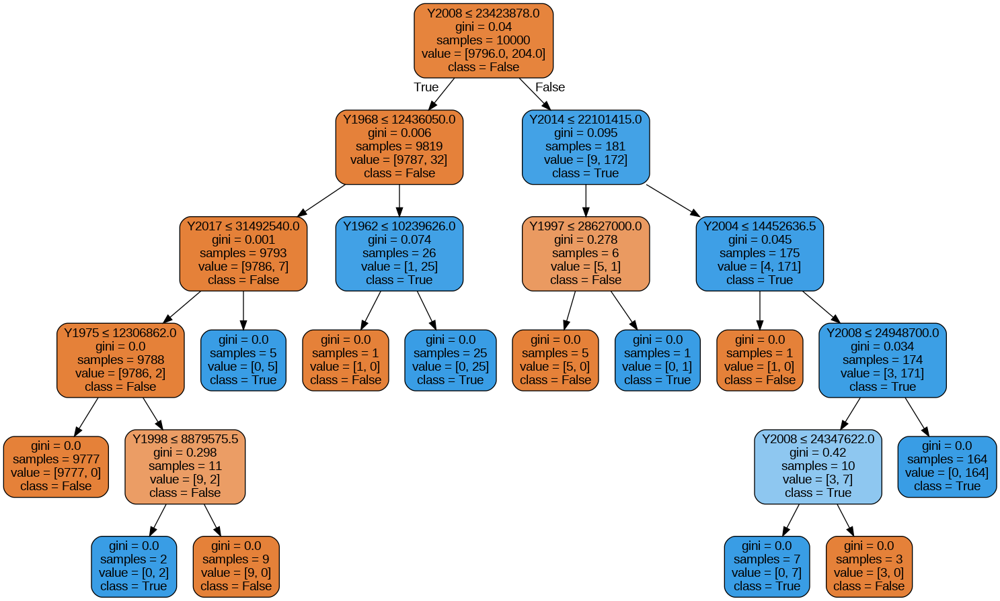

In [ ]:
from sklearn import tree
import graphviz
from IPython.display import Image

# Train the classifier
clf = tree.DecisionTreeClassifier(random_state=42)
X = comparative_df.drop('Outlier', axis=1)  # Features
y = comparative_df['Outlier']  # Target variable

clf = clf.fit(X, y)

# Export the decision tree to a DOT object
dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=X.columns,
                                class_names=['False', 'True'],
                                filled=True, rounded=True,
                                special_characters=True)

# Create a Graphviz object from the DOT object
graph = graphviz.Source(dot_data)

# Render the decision tree to an image file
graph.render(filename='/mnt/data/tree', format='png', cleanup=True)

# Display the image in the notebook
Image(filename='/mnt/data/tree.png')


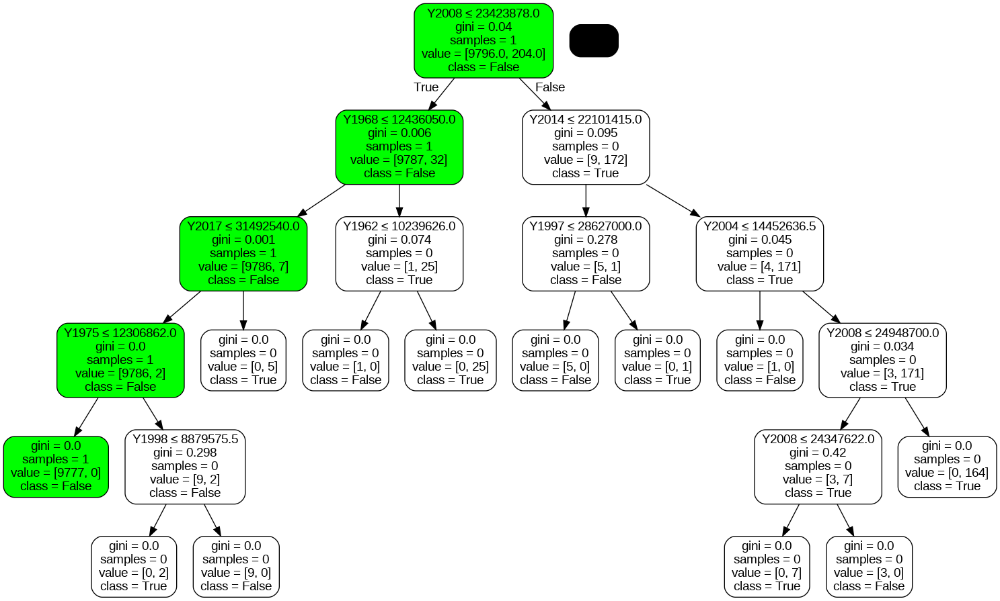

In [ ]:
import pydotplus
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image

# Definir X como todas las características excepto 'Outlier'
X = comparative_df.drop('Outlier', axis=1)

# Definir y como la columna 'Outlier'
y = comparative_df['Outlier']

# Entrenar el clasificador
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X, y)

# Exportar el árbol de decisión a un archivo DOT
dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=X.columns,
                                class_names=['False', 'True'],
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)

# Vaciar todos los nodos, es decir, establecer el color en blanco y el número de muestras en cero
for node in graph.get_node_list():
    if node.get_attributes().get('label') is None:
        continue
    if 'samples = ' in node.get_attributes()['label']:
        labels = node.get_attributes()['label'].split('<br/>')
        for i, label in enumerate(labels):
            if label.startswith('samples = '):
                labels[i] = 'samples = 0'
        node.set('label', '<br/>'.join(labels))
        node.set_fillcolor('white')

# Seleccionar un ejemplo de muestra (puedes ajustar el índice como desees)
sample_index = 0
sample = X.iloc[[sample_index]]
decision_paths = clf.decision_path(sample)

for decision_path in decision_paths:
    for n, node_value in enumerate(decision_path.toarray()[0]):
        if node_value == 0:
            continue
        node = graph.get_node(str(n))[0]
        node.set_fillcolor('green')
        labels = node.get_attributes()['label'].split('<br/>')
        for i, label in enumerate(labels):
            if label.startswith('samples = '):
                samples_count = int(label.split('=')[1]) + 1
                labels[i] = 'samples = {}'.format(samples_count)

        node.set('label', '<br/>'.join(labels))

# Guardar y mostrar el gráfico modificado
filename = 'tree_with_path.png'  # Ajusta la ruta según sea necesario
graph.write_png(filename)

# Mostrar la imagen
Image(filename=filename)
